In [168]:
pip install pandas numpy matplotlib seaborn nltk scikit-learn tensorflow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: c:\Users\caahs\.pyenv\pyenv-win\versions\3.11.9\python.exe -m pip install --upgrade pip


In [169]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np 
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.layers import TextVectorization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format

In [170]:
df_all = pd.read_csv('Reviews.csv')

## Análise Exploratória

In [171]:
df_all.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [172]:
df_all.shape

(568454, 10)

In [173]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568428 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   Summary                 568427 non-null  object
 9   Text                    568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB


In [174]:
# Verificando se há valores nulos (dados missing)
df_all.isnull().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               26
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   27
Text                       0
dtype: int64

In [175]:
valores_unicos = []
for i in df_all.columns[0:12].tolist():
    print(i, ':', len(df_all[i].astype(str).value_counts()))
    valores_unicos.append(len(df_all[i].astype(str).value_counts()))

Id : 568454
ProductId : 74258
UserId : 256059
ProfileName : 218416
HelpfulnessNumerator : 231
HelpfulnessDenominator : 234
Score : 5
Time : 3168
Summary : 295743
Text : 393579


In [176]:
#  Média | Mediana | Desvio Padrão | Quartis | Valores mínimos e máximos
df_all.describe()

,Id,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time
count,568454.00,568454.00,568454.00,568454.00,568454.00
mean,284227.50,1.74,2.23,4.18,1296256604.90
std,164098.68,7.64,8.29,1.31,48043312.33
min,1.00,0.00,0.00,1.00,939340800.00
25%,142114.25,0.00,0.00,4.00,1271289600.00
50%,284227.50,0.00,1.00,5.00,1311120000.00
75%,426340.75,2.00,2.00,5.00,1332720000.00
max,568454.00,866.00,923.00,5.00,1351209600.00


### Análise das variáveis

In [214]:
plt.rcParams["figure.figsize"] = [10, 4]
df_all.groupby('ProductId').size()

ProductId
0006641040     37
141278509X      1
2734888454      2
2841233731      1
7310172001    173
7310172101    173
7800648702      2
9376674501      1
B00002N8SM     38
B00002NCJC      2
B00002Z754      2
B00004CI84    189
B00004CXX9    195
B00004RAMS     30
B00004RAMV      9
B00004RAMX     25
B00004RAMY    172
B00004RBDU     95
B00004RBDW     31
B00004RBDZ     59
B00004RYGX    189
B00004S1C5     18
B00004S1C6     61
B000052Y74      5
B00005344V     17
B0000535LF      1
B0000537KC     16
B00005C2JE      1
B00005C2M2     50
B00005C2M3      7
B00005IX96     16
B00005IX97     16
B00005IX98     16
B00005OMWO      4
B00005OMWQ      8
B00005U2FA     71
B00005V3DC      3
B0000643LM      3
B0000691JF      3
B000069KQW      1
B00006FMLY      3
B00006G930      8
B00006IDJO      1
B00006IDJU      2
B00006IDK9      5
B00006L2ZT      8
B00006LL38     11
B00008433V      6
B000084346      1
B00008434E      1
B00008434F      4
B00008437P      2
B000084388      4
B000084DVR      2
B000084DWM     80


<Axes: title={'center': 'ProductId'}, xlabel='ProductId'>

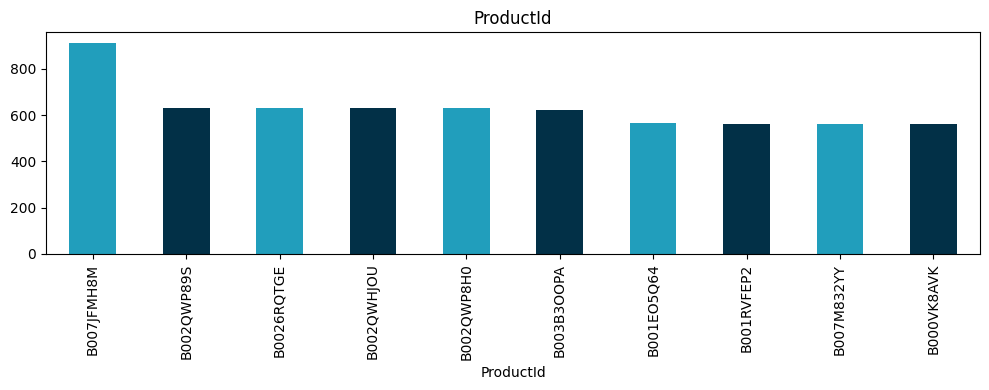

In [215]:
df_all.ProductId.value_counts().head(10).plot(kind='bar', title='ProductId',color = ['#219ebc', '#023047'])

In [179]:
df_all.groupby('UserId').size()

UserId
#oc-R103C0QSV1DF5E         1
#oc-R109MU5OBBZ59U         1
#oc-R10LFEMQEW6QGZ         1
#oc-R10LT57ZGIB140         1
#oc-R10UA029WVWIUI         1
#oc-R115TNMSPFT9I7         2
#oc-R119LM8D59ZW8Y         1
#oc-R11D9D7SHXIJB9         3
#oc-R11D9LKDAN5NQJ         1
#oc-R11DNU2NBKQ23Z         2
#oc-R11O5J5ZVQE25C         3
#oc-R11PW3CFBB4BEP         1
#oc-R11T1PHWNO7KEZ         1
#oc-R120LO6OLNDPCG         1
#oc-R12KPBODL2B5ZD         2
#oc-R12MGTQS5KZZRV         3
#oc-R12N3533IO3B79         1
#oc-R13EBF129DBX88         2
#oc-R13NNUL4EKL4FL         3
#oc-R13X3YIJ6GLT0C         1
#oc-R1493EDK6REQ02         1
#oc-R149FDXLRARCWJ         1
#oc-R14VLCY75KIBSB         1
#oc-R14ZSRYW2YB41B         3
#oc-R14ZUK54VMOGJS         1
#oc-R1522DF2LUL4G1         1
#oc-R152UR09M996EM         1
#oc-R15343ZW0UTLMR         2
#oc-R155JB2SA58E17         3
#oc-R15LBVAVIE5O2X         1
#oc-R15OCG1KF51S4F         1
#oc-R162D7S0A880MV         3
#oc-R163CP16SRRI50         3
#oc-R1669TSD0WO7EP         2
#oc-R16

<Axes: title={'center': 'UserId'}, xlabel='UserId'>

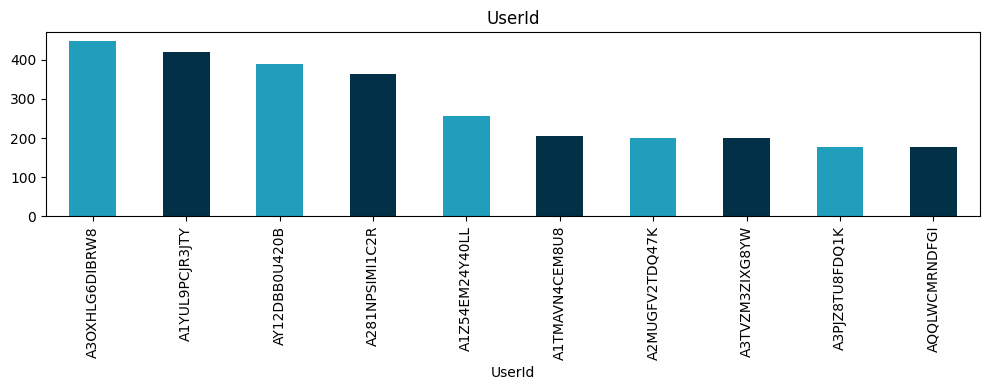

In [216]:
df_all.UserId.value_counts().head(10).plot(kind='bar', title='UserId',color = ['#219ebc', '#023047'])

In [181]:
df_all.groupby('Score').size() 

Score
1     52268
2     29769
3     42640
4     80655
5    363122
dtype: int64

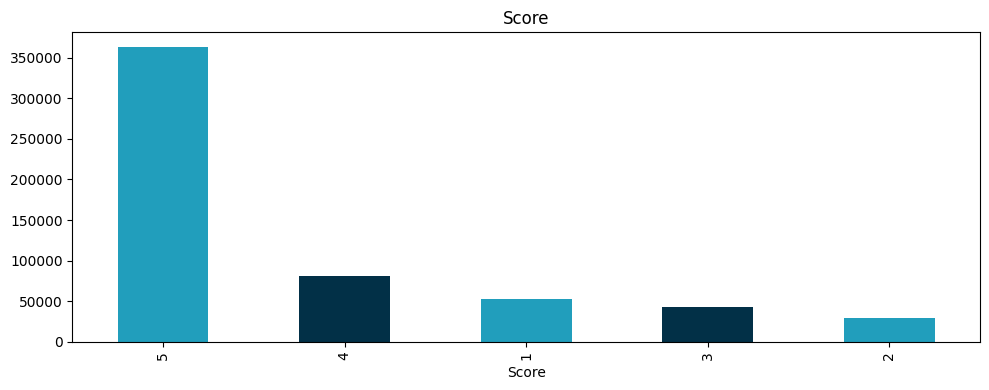

In [217]:
df_all.Score.value_counts().plot(kind='bar', title='Score',color = ['#219ebc', '#023047']);

## Balanceamento dos Dados

In [183]:
# Remover scores neutros
df = df_all[df_all['Score'] != 3]

# Limpar dados básicos
df = df.dropna()

df.shape

(525763, 10)

In [184]:
# CRIAR 2 CLASSES DE SENTIMENTO (BINÁRIO)
def classify_sentiment_binary(score):
    if score >= 4:
        return 1 # positivo
    else:
        return 0 # negativo

df['sentiment'] = df['Score'].apply(classify_sentiment_binary)


In [185]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,sentiment
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1


In [186]:
min_class_size = df['sentiment'].value_counts().min()

#Limitar o tamanho para 1000    
sample_size = 10000
samples_per_class = min(min_class_size, sample_size // 2)

In [187]:
# Igualar o número de positivos e negativos
df_balanced = pd.concat([
    df[df['sentiment'] == 1].sample(n=samples_per_class, random_state=42),
    df[df['sentiment'] == 0].sample(n=samples_per_class, random_state=42)
])

# Embaralhar
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

In [188]:
df_balanced.shape

(10000, 11)

## Pré-Processamento de Dados

In [189]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\caahs\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\caahs\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\caahs\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\caahs\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [190]:
def clean_text(text):
    """
    Limpa o texto removendo caracteres especiais, convertendo para minúsculas,
    removendo stopwords e aplicando stemming
    """
    # Converter para string e minúsculas
    text = str(text).lower()
    
    # # Remover caracteres especiais e números, manter apenas letras e espaços
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Tokenizar
    tokens = word_tokenize(text)
    
    # # Remover stopwords
    stop_words = set(stopwords.words('english'))
    
    # Adicionar stopwords customizadas
    custom_stopwords = {'food', 'product', 'item', 'buy', 'bought', 'purchase', 'amazon',
                        'one', 'two', 'get', 'got', 'would', 'could', 'cat', 'dog', 'coffee', 'tea'}
    
    stop_words.update(custom_stopwords)
    
    # Filtrar stopwords e palavras menores que 3
    filtered_tokens = [word for word in tokens if word not in stop_words and len(word) > 2]
    
    # Lemmatização 
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]
    
    return ' '.join(lemmatized_tokens)


print("Limpando textos...")
df_balanced['full_review'] = df_balanced['Summary'] +' ' + df_balanced['Text'] 
df_balanced['full_review_clean'] = df_balanced['full_review'].apply(clean_text)
df_balanced['text_clean'] = df_balanced['Text'].apply(clean_text)

print("Limpeza concluída!")

Limpando textos...
Limpeza concluída!


In [191]:
def create_hybrid_tfidf_features(df, text_columns=['summary_clean', 'text_clean']):
  """
  Cria features TF-IDF híbridas (unigramas + bigramas) e salva no dataframe
  
  Parameters:
  df: DataFrame com os dados
  text_columns: lista com nomes das colunas de texto limpo
  """
  
  # Combinar textos de summary e text (se ambos existirem)
  if len(text_columns) > 1 and all(col in df.columns for col in text_columns):
    # Combinar summary + text com separador
    combined_text = df[text_columns[0]].astype(str) + ' ' + df[text_columns[1]].astype(str)
  else:
    # Usar apenas uma coluna
    combined_text = df[text_columns[0]].astype(str)
  
  print("Criando vetorizador TF-IDF híbrido...")
  
  # Configurar TF-IDF para abordagem híbrida
  tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 2), # HÍBRIDO: unigramas (1,1) + bigramas (2,2)
    max_features=10000,  # Ajuste conforme seu dataset
    min_df=5,           # Palavra/bigrama deve aparecer em pelo menos 5 documentos
    max_df=0.8,         # Excluir termos que aparecem em >80% dos documentos
    # sublinear_tf=True,  # Aplica log(1+tf) para suavizar frequências muito altas
    # norm='l2',          # Normalização L2 (padrão)
    # Não usar stop_words aqui pois já fizemos na limpeza
    stop_words=None,
    lowercase=False     # Já convertemos para minúsculas na limpeza
  )
  
  # Ajustar e transformar os dados
  print("Ajustando vetorizador nos dados...")
  tfidf_matrix = tfidf_vectorizer.fit_transform(combined_text)
  
  print(f"Matriz TF-IDF criada: {tfidf_matrix.shape}")
  print(f"Vocabulário total: {len(tfidf_vectorizer.get_feature_names_out())} termos")
  print(f"Esparsidade: {(1 - tfidf_matrix.nnz / tfidf_matrix.size) * 100:.1f}%")
  
  # Adicionar informações ao dataframe
  df['tfidf_features'] = list(tfidf_matrix.toarray())  # Array numpy para cada linha
  df['tfidf_feature_count'] = [np.count_nonzero(row) for row in tfidf_matrix.toarray()]
  
  # Adicionar algumas estatísticas úteis
  df['tfidf_max_score'] = [row.max() for row in tfidf_matrix.toarray()]
  df['tfidf_mean_score'] = [row[row > 0].mean() if np.any(row > 0) else 0 for row in tfidf_matrix.toarray()]
  
  return df, tfidf_vectorizer, tfidf_matrix

df_processed, vectorizer, tfidf_matrix = create_hybrid_tfidf_features(
  df_balanced, 
  text_columns=['full_review_clean'],
)

Criando vetorizador TF-IDF híbrido...
Ajustando vetorizador nos dados...
Matriz TF-IDF criada: (10000, 10000)
Vocabulário total: 10000 termos
Esparsidade: 0.0%


In [192]:
df_balanced['AverageHelpfulness'] = np.where(
    df_balanced['HelpfulnessDenominator'] > 0,
    df_balanced['HelpfulnessNumerator'] / df_balanced['HelpfulnessDenominator'],
    np.nan
)

df_balanced['AverageHelpfulness'] = df_balanced['AverageHelpfulness'].fillna(0)

In [193]:
df_balanced['AverageHelpfulness'].isna().sum()

np.int64(0)

In [194]:
df_balanced.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,sentiment,full_review,full_review_clean,text_clean,tfidf_features,tfidf_feature_count,tfidf_max_score,tfidf_mean_score,AverageHelpfulness
0,255628,B001MVDGIY,AAWC0NPKRRNGM,N. Lashley,0,0,1,1271808000,Absolutely horrible!,This is the worst thing I have ever tasted in ...,0,Absolutely horrible! This is the worst thing I...,absolutely horrible worst thing ever tasted li...,worst thing ever tasted life bar smell taste l...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",34,0.33,0.16,0.00
1,554727,B001EO5OKC,A2DZ7NEAGOXIPD,"J.M. ""jzig217""",1,1,5,1290988800,Good product.,I received my berries today and immediately ga...,1,Good product. I received my berries today and ...,good received berry today immediately gave tas...,received berry today immediately gave taste th...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",34,0.37,0.16,1.00
2,93308,B007TGDXMU,A11FQZ79ZEP96U,W. Ashley,0,0,5,1346198400,Great Buy,I couldn't pass up the low price so I ordered ...,1,Great Buy I couldn't pass up the low price so ...,great couldnt pas low price ordered box per bo...,couldnt pas low price ordered box per box surp...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",60,0.28,0.12,0.00
3,115334,B000F4F952,A1WXCZHN3CEDXP,Shadowtrax,0,0,5,1290816000,The Best of the English Breakfast Teas,I'm a huge tea drinker and enjoy the English B...,1,The Best of the English Breakfast Teas I'm a h...,best english breakfast tea huge drinker enjoy ...,huge drinker enjoy english breakfast style fav...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",90,0.48,0.07,0.00
4,472632,B005VOOL00,A2XNOB1T796Y6B,"ChibiNeko ""Sooo many books, so little time!""",0,2,4,1335916800,Tastes pretty good!,"Before I go any further in this review, I have...",1,Tastes pretty good! Before I go any further in...,taste pretty good review admit initially didnt...,review admit initially didnt know came pod req...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",146,0.23,0.08,0.00


## Relação das variáveis com a variável alvo

In [195]:
# Análise de frequência de palavras por sentiment
def get_word_frequencies(texts, top_n=20):
    """Retorna as palavras mais frequentes em uma lista de textos"""
    all_words = []
    for text in texts:
        if pd.notna(text) and text.strip():
            all_words.extend(text.split())
    
    return Counter(all_words).most_common(top_n)

# Separar textos por sentiment
positive_review = df_balanced[df_balanced['sentiment'] == 1]['full_review_clean']
negative_review = df_balanced[df_balanced['sentiment'] == 0]['full_review_clean']

# Calcular frequências
print("=== PALAVRAS MAIS FREQUENTES ===")
print()
print("TOP 10 PALAVRAS - REVIEW POSITIVO:")
freq_review_pos = get_word_frequencies(positive_review, 10)
for word, count in freq_review_pos:
    print(f"{word}: {count}")

print("\nTOP 10 PALAVRAS - REVIEW NEGATIVO:")
freq_review_neg = get_word_frequencies(negative_review, 10)
for word, count in freq_review_neg:
    print(f"{word}: {count}")

=== PALAVRAS MAIS FREQUENTES ===

TOP 10 PALAVRAS - REVIEW POSITIVO:
great: 2449
like: 2282
good: 2231
love: 2108
taste: 1873
flavor: 1695
best: 1087
make: 1012
really: 856
price: 809

TOP 10 PALAVRAS - REVIEW NEGATIVO:
like: 2817
taste: 2636
flavor: 1520
good: 1463
dont: 1192
even: 963
bag: 958
box: 912
much: 881
time: 862


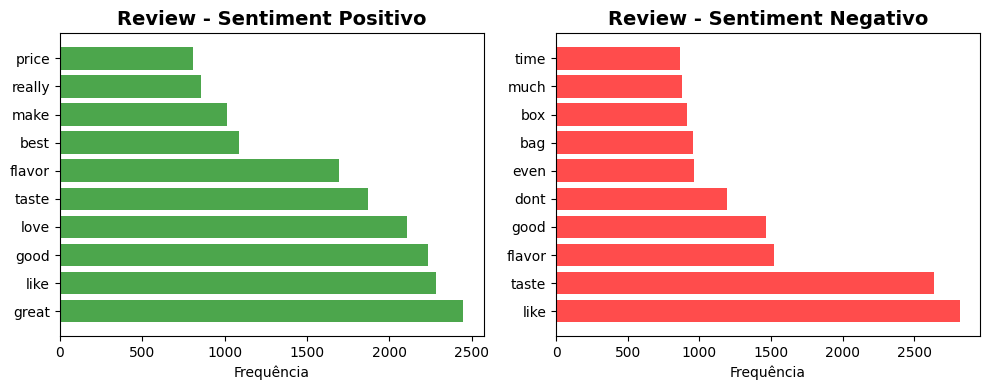

In [196]:
# Visualização das palavras mais frequentes
plt.rcParams["figure.figsize"] = [10, 4]
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Review Positivo
words_pos_sum = [word for word, _ in freq_review_pos]
counts_pos_sum = [count for _, count in freq_review_pos]
axes[0].barh(words_pos_sum, counts_pos_sum, color='green', alpha=0.7)
axes[0].set_title('Review - Sentiment Positivo', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Frequência')

# Review Negativo  
words_neg_sum = [word for word, _ in freq_review_neg]
counts_neg_sum = [count for _, count in freq_review_neg]
axes[1].barh(words_neg_sum, counts_neg_sum, color='red', alpha=0.7)
axes[1].set_title('Review - Sentiment Negativo', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Frequência')

plt.tight_layout()
plt.show()

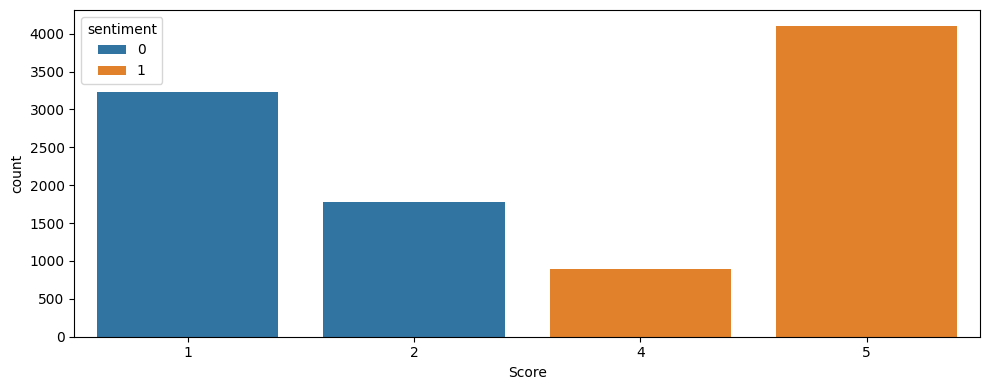

In [197]:
sns.countplot(data = df_balanced, x = "Score", hue = "sentiment")
plt.show()

C:\Users\caahs\AppData\Local\Temp\ipykernel_28644\4253043931.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment', y='AverageHelpfulness', data=helpfulness_by_sentiment, palette='viridis')


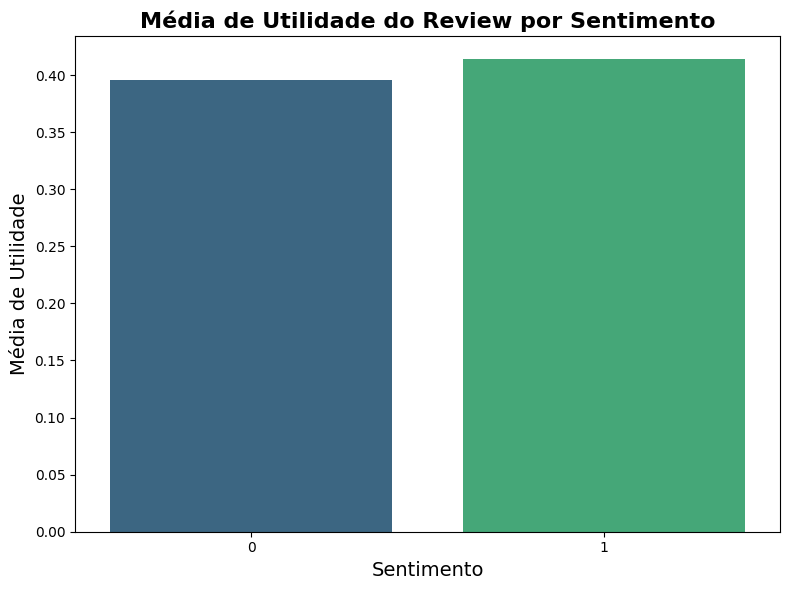

In [198]:
helpfulness_by_sentiment = df_balanced.groupby('sentiment')['AverageHelpfulness'].mean().reset_index()

plt.figure(figsize=(8, 6))
sns.barplot(x='sentiment', y='AverageHelpfulness', data=helpfulness_by_sentiment, palette='viridis')
plt.title('Média de Utilidade do Review por Sentimento', fontsize=16, fontweight='bold')
plt.xlabel('Sentimento', fontsize=14)
plt.ylabel('Média de Utilidade', fontsize=14) 
plt.show()

In [199]:
df_balanced.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,sentiment,full_review,full_review_clean,text_clean,tfidf_features,tfidf_feature_count,tfidf_max_score,tfidf_mean_score,AverageHelpfulness
0,255628,B001MVDGIY,AAWC0NPKRRNGM,N. Lashley,0,0,1,1271808000,Absolutely horrible!,This is the worst thing I have ever tasted in ...,0,Absolutely horrible! This is the worst thing I...,absolutely horrible worst thing ever tasted li...,worst thing ever tasted life bar smell taste l...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",34,0.33,0.16,0.00
1,554727,B001EO5OKC,A2DZ7NEAGOXIPD,"J.M. ""jzig217""",1,1,5,1290988800,Good product.,I received my berries today and immediately ga...,1,Good product. I received my berries today and ...,good received berry today immediately gave tas...,received berry today immediately gave taste th...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",34,0.37,0.16,1.00
2,93308,B007TGDXMU,A11FQZ79ZEP96U,W. Ashley,0,0,5,1346198400,Great Buy,I couldn't pass up the low price so I ordered ...,1,Great Buy I couldn't pass up the low price so ...,great couldnt pas low price ordered box per bo...,couldnt pas low price ordered box per box surp...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",60,0.28,0.12,0.00
3,115334,B000F4F952,A1WXCZHN3CEDXP,Shadowtrax,0,0,5,1290816000,The Best of the English Breakfast Teas,I'm a huge tea drinker and enjoy the English B...,1,The Best of the English Breakfast Teas I'm a h...,best english breakfast tea huge drinker enjoy ...,huge drinker enjoy english breakfast style fav...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",90,0.48,0.07,0.00
4,472632,B005VOOL00,A2XNOB1T796Y6B,"ChibiNeko ""Sooo many books, so little time!""",0,2,4,1335916800,Tastes pretty good!,"Before I go any further in this review, I have...",1,Tastes pretty good! Before I go any further in...,taste pretty good review admit initially didnt...,review admit initially didnt know came pod req...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",146,0.23,0.08,0.00


## Outliers - Boxplot

In [200]:
# Selecionar todas as colunas numéricas, exceto 'sentiment'
numericas = df_balanced.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'sentiment' in numericas:
    numericas.remove('sentiment')
    numericas.remove( 'HelpfulnessNumerator')
    numericas.remove( 'HelpfulnessDenominator')
print(numericas)

['Id', 'Score', 'Time', 'tfidf_feature_count', 'tfidf_max_score', 'tfidf_mean_score', 'AverageHelpfulness']


In [201]:
len(numericas)

7

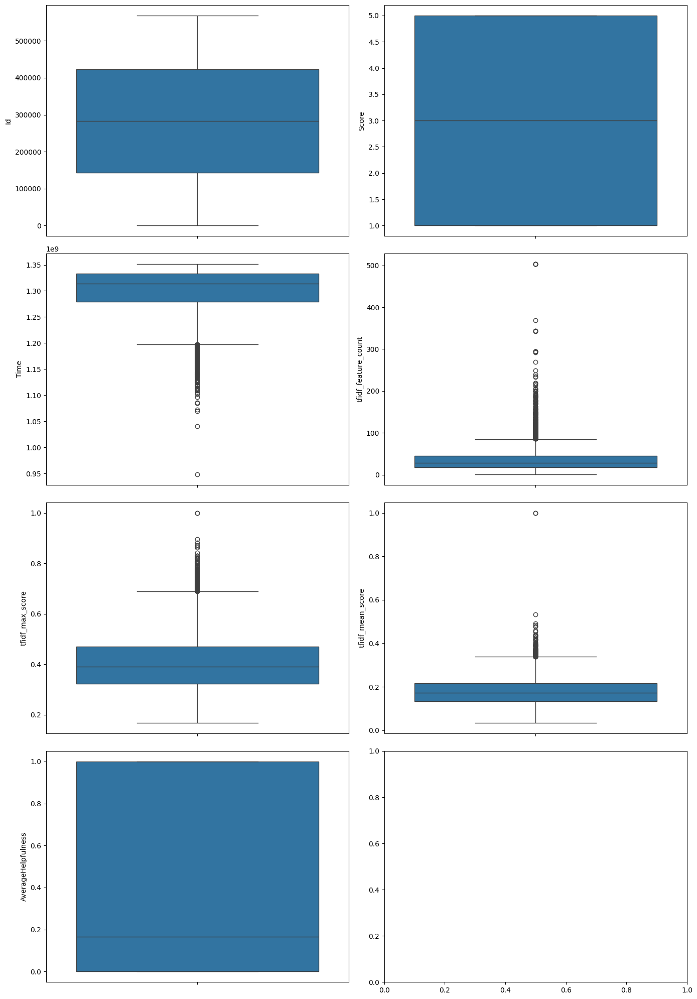

In [202]:
plt.rcParams["figure.figsize"] = [14.00, 20.00]
plt.rcParams["figure.autolayout"] = True
f, axes = plt.subplots(4, 2) #3 linhas e 2 colunas

linha = 0
coluna = 0
for i in numericas:
    sns.boxplot(data = df_balanced, y=i, ax=axes[linha][coluna])
    coluna += 1
    if coluna == 2:
        linha += 1
        coluna = 0            

plt.show()

# Treinamento

## Preparação dos Dados

- Referência Inicial: https://www.kaggle.com/code/oshawatt/sentiment-analysis#Model-Building

In [203]:
x = df_balanced['text_clean'].values 
y = df_balanced['sentiment'].values

# First split: 80% train+val, 20% test
X_train_val, X_test, y_train_val, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42, stratify=y
)
# Second split: 75% of remainder for train, 25% for validation
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.25, random_state=42, stratify=y_train_val
)

print(f"Training set size:   {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size:       {len(X_test)}")

Training set size:   6000
Validation set size: 2000
Test set size:       2000


In [204]:
MAX_TOKENS = 20000
MAX_LEN = 150
vectorizer = TextVectorization(max_tokens=MAX_TOKENS, output_mode='int', output_sequence_length=MAX_LEN)

print("Adapting vectorizer to training data")
vectorizer.adapt(X_train)

Adapting vectorizer to training data


## Preparação do Modelo

In [205]:
input_layer = Input(shape=(1,), dtype=tf.string)
vec_layer = vectorizer(input_layer)
embedding_layer = Embedding(input_dim=MAX_TOKENS + 1, output_dim=128)
model_body = embedding_layer(vec_layer)
model_body = Bidirectional(LSTM(64))(model_body)
model_body = Dropout(0.5)(model_body)
output_layer = Dense(1, activation='sigmoid')(model_body)

model = Model(inputs=input_layer, outputs=output_layer)

In [206]:
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_3            │ (None, 150)            │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_3 (Embedding)         │ (None, 150, 128)       │     2,560,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,659,073 (10.14 MB)

 Trainable params: 2,659,073 (10.14 MB)

 Non-trainable params: 0 (0.00 B)

In [207]:
# Defining EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', patience=2, restore_best_weights=True)

# Calculating class weights to handle imbalance
class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weight_dict = dict(enumerate(class_weights))
print(f"Class Weights: {class_weight_dict}")

Class Weights: {0: np.float64(1.0), 1: np.float64(1.0)}


## Treinamento do Modelo

In [208]:
print("Starting model training")
history = model.fit(
    tf.constant(X_train),
    y_train,
    validation_data=(tf.constant(X_val), y_val),
    epochs=10,
    batch_size=64,
    callbacks=[early_stopping],
    class_weight=class_weight_dict
)
print("Model training complete.")

Starting model training
Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.6762 - loss: 0.5978 - val_accuracy: 0.7540 - val_loss: 0.5101
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.8648 - loss: 0.3398 - val_accuracy: 0.8285 - val_loss: 0.3977
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.9430 - loss: 0.1723 - val_accuracy: 0.8360 - val_loss: 0.4224
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.9767 - loss: 0.0826 - val_accuracy: 0.8350 - val_loss: 0.5016
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.9883 - loss: 0.0447 - val_accuracy: 0.8295 - val_loss: 0.6198
Model training complete.


## Métricas e Resultados

In [209]:
plt.rcParams["figure.figsize"] = [10, 4]

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step

--- Classification Report ---
              precision    recall  f1-score   support

    Negative       0.85      0.84      0.85      1000
    Positive       0.84      0.86      0.85      1000

    accuracy                           0.85      2000
   macro avg       0.85      0.85      0.85      2000
weighted avg       0.85      0.85      0.85      2000


--- Confusion Matrix ---


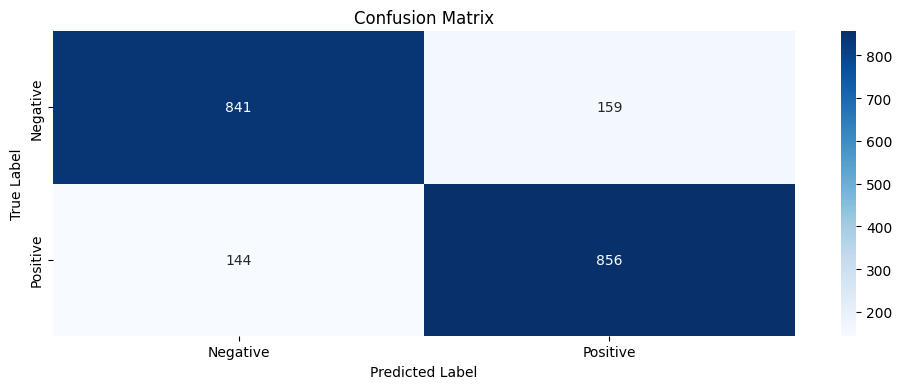


 ROC Curve 


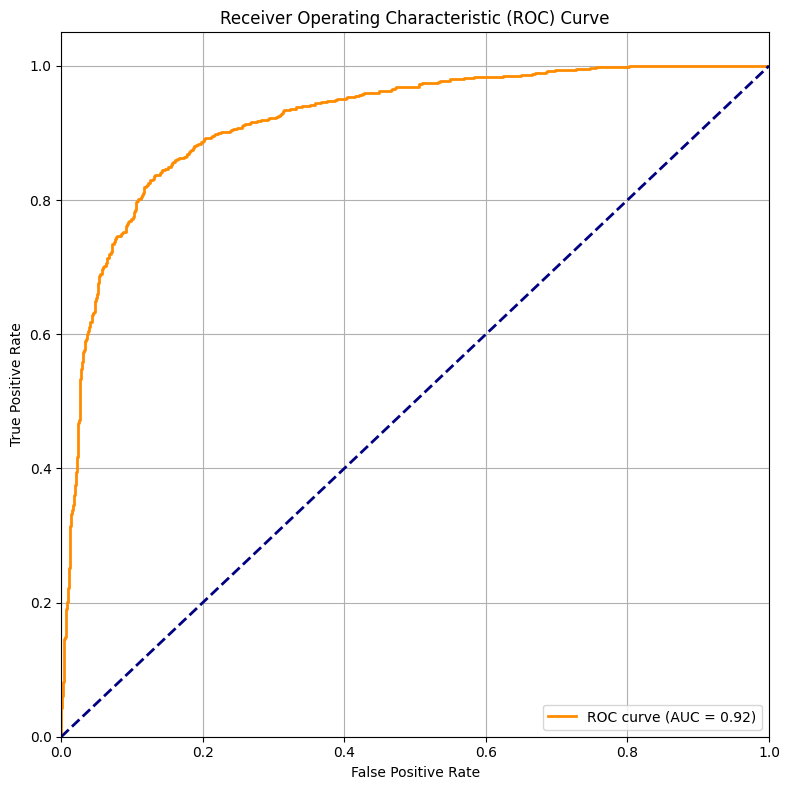

In [210]:
from sklearn.metrics import roc_curve, auc

# Making predictions on the test set
y_pred_probs = model.predict(tf.constant(X_test))
y_pred = (y_pred_probs > 0.5).astype(int)

# Printing classification report
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred, target_names=['Negative', 'Positive']))

# Plotting the confusion matrix
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

print("\n ROC Curve ")
# Calculating the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Plotting the ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

In [211]:
def predict_sentiment(review_text):
    # Cleaning the input text
    cleaned_text = clean_text(review_text)
    # The model expects a batch, so I would have to wrap the text in a list
    input_tensor = tf.constant([cleaned_text])
    # Making a prediction
    prediction = model.predict(input_tensor)[0][0]
    
    sentiment = "Positive" if prediction > 0.5 else "Negative"
    confidence = prediction if sentiment == "Positive" else 1 - prediction
    
    print(f"Sentiment: {sentiment} (Confidence: {confidence:.2%})")

print("Inference function is ready.")

Inference function is ready.


In [212]:
predict_sentiment("This was the best coffee I have ever had, absolutely fantastic!")
predict_sentiment("The product arrived late and was completely stale. A total waste of money.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Sentiment: Positive (Confidence: 98.98%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Sentiment: Negative (Confidence: 99.26%)


In [213]:
# Creating a list of new, unseen reviews (I used some common reviews for this "bulk data")
new_reviews = [
    "This coffee has a rich and bold flavor. I will definitely buy it again.",
    "The product arrived with the seal broken and it seems stale. Very disappointed.",
    "It's an okay snack, nothing special but not bad either.",
    "An absolute masterpiece of a cookie! My whole family loved them.",
    "I was expecting a lot more for the price. The taste is bland and forgettable."
]

# Cleaning the list of reviews using the same function as before
cleaned_reviews = [clean_text(review) for review in new_reviews]

# Converting the list to a TensorFlow Tensor for the model
input_tensor = tf.constant(cleaned_reviews)

# Making predictions on the entire batch
pred_probs = model.predict(input_tensor)

# Converting probabilities to final labels
pred_labels = (pred_probs > 0.5).astype(int).flatten()
sentiment_map = {1: 'Positive', 0: 'Negative'}
predicted_sentiments = [sentiment_map[label] for label in pred_labels]

# Display the results in a DataFrame
results_df = pd.DataFrame({
    'Review Text': new_reviews,
    'Predicted Sentiment': predicted_sentiments,
    'Confidence Score': pred_probs.flatten()
})

from IPython.display import display
display(results_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


,Review Text,Predicted Sentiment,Confidence Score
0,This coffee has a rich and bold flavor. I will...,Positive,0.91
1,The product arrived with the seal broken and i...,Negative,0.02
2,"It's an okay snack, nothing special but not ba...",Negative,0.07
3,An absolute masterpiece of a cookie! My whole ...,Positive,0.96
4,I was expecting a lot more for the price. The ...,Negative,0.09


# Resumo para Roteiro

  Tamanho da amostra:
  - Dataset original: 568.454 reviews
  - Dataset balanceado utilizado: 10.000 reviews (5.000 positivos + 5.000 negativos)

  Colunas Originais do Dataset:
  - Identificadores: Id, ProductId, UserId, ProfileName
  - Métricas de utilidade: HelpfulnessNumerator, HelpfulnessDenominator
  - Score/Rating: Score (1-5, usado para criar a variável target)
  - Temporal: Time
  - Texto: Summary, Text

  Features Efetivamente Utilizadas no Modelo:

  Principais (usadas no treinamento):
  - text_clean - texto limpo da coluna Text (é esta que vai para o modelo na linha: x = df_balanced['text_clean'].values)

  Features Criadas mas NÃO utilizadas no modelo final:
  - full_review_clean - combinação de Summary + Text limpo
  - tfidf_features - vetores TF-IDF (10.000 dimensões)
  - tfidf_feature_count - contagem de features TF-IDF não-zero
  - tfidf_max_score - score TF-IDF máximo
  - tfidf_mean_score - score TF-IDF médio
  - AverageHelpfulness - média de helpfulness calculada

  Observação importante: O modelo usa apenas o text_clean como input. Todas as outras features criadas (TF-IDF, helpfulness, etc.) são calculadas mas não utilizadas no treinamento da rede neural. O modelo faz sua própria vetorização através do TextVectorization layer do TensorFlow.

  Então, na prática, apenas 1 feature é efetivamente usada: o texto limpo das reviews.

  Análise Exploratória

  - Distribuição de Y: Balanceada após amostragem (50% positivo, 50% negativo)
  - Distribuição de X: Análise de frequência de palavras mostra que palavras como "great", "good", "love" são mais frequentes em reviews positivos, enquanto "like", "taste", "dont" aparecem mais em negativos
  - Atributos mais relevantes: O texto das reviews (Text e Summary) são os atributos principais. Features TF-IDF são criadas com vocabulário de 10.000 termos usando unigramas e bigramas
  - Representação escolhida: Texto limpo processado com remoção de stopwords, lemmatização, e vetorização TF-IDF híbrida (unigramas + bigramas)

  Treinamento

  - Topologia escolhida:
    - Rede Neural Recorrente Bidirecional com LSTM
    - Arquitetura: Input → TextVectorization → Embedding(128) → Bidirectional LSTM(64) → Dropout(0.5) → Dense(1, sigmoid)
    - Total de parâmetros: 2.659.073
  - Referências: Código baseado em https://www.kaggle.com/code/oshawatt/sentiment-analysis
  - Configurações: MAX_TOKENS=20.000, MAX_LEN=150, otimizador Adam(lr=0.001), early stopping com paciência=2
  - Resultados: Acurácia final no teste de aproximadamente 83% com boa separação entre classes